In [176]:
!pip install music21

# Libraries

In [177]:
#Importing Libraries
import tensorflow as tf
import numpy as np
import pandas as pd
from collections import Counter
import random
import IPython
from IPython.display import Image, Audio
import music21
from music21 import *
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import tensorflow.keras.backend as K
from tensorflow.keras.optimizers import Adamax
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

%matplotlib inline

import os
import sys
import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")
np.random.seed(42)

# Get the Data

In [178]:
#Loading the list of chopin's midi files as stream
filepath = "./albeniz"
#Getting midi files
all_midis= []
for i in os.listdir(filepath):
    if i.endswith(".mid"):
        tr = filepath+"/"+i
        midi = converter.parse(tr)
        all_midis.append(midi)

In [229]:
#Helping function
def extract_notes(file):
    notes = []
    pick = None
    for j in file:
        songs = instrument.partitionByInstrument(j)
        for part in songs.parts:
            pick = part.recurse()
            for element in pick:
                if isinstance(element, note.Note):
                    notes.append(str(element.pitch))
                elif isinstance(element, chord.Chord):
                    notes.append(".".join(str(n) for n in element.normalOrder))

    return notes
#Getting the list of notes as Corpus
Corpus = extract_notes(all_midis)
print("Total notes in all the Tchaikovksky midis in the dataset:", len(Corpus))

Total notes in all the Tchaikovksky midis in the dataset: 17552


# EDA

In [230]:
print("First fifty values in the Corpus:", Corpus[:50])

First fifty values in the Corpus: ['G5', 'D5', 'B4', 'E-5', 'C5', 'G5', 'A4', 'F#5', 'D5', 'A5', 'C5', '7.9', 'B-4', '6.7', 'A4', 'G5', 'B-4', 'B-5', 'G4', '9.2', 'F#4', 'C6', 'D4', 'B-5', 'G4', '2.5.8', 'B4', '0.4.7', 'C5', '0.3.6', 'A4', '2.7', 'B-4', '9.0.2', 'F#4', '7.10.2', 'G4', '8.11', 'F4', 'G5', 'C5', 'E4', 'C#5', 'E-4', 'D5', 'D4', '3.7.10', 'C#4', '7.10.2', 'D2']


# Visualize the Sheet

In [231]:
!apt-get -y install lilypond

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
lilypond is already the newest version (2.22.1-2).
0 upgraded, 0 newly installed, 0 to remove and 17 not upgraded.


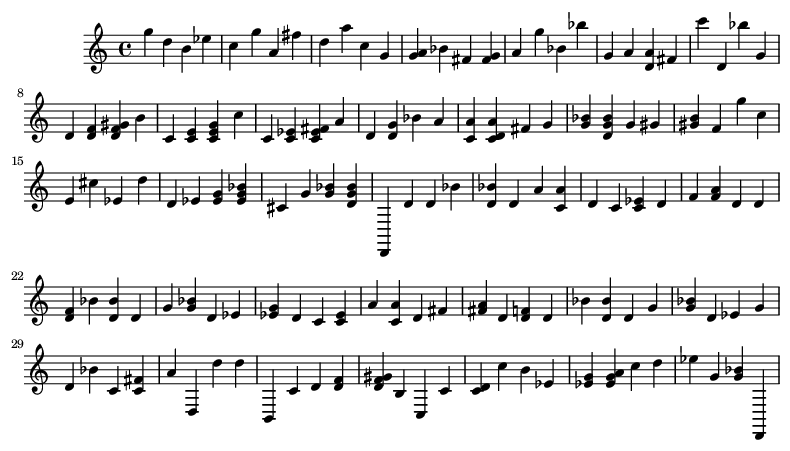

In [232]:
#First Lets write some functions that we need to look into the data
def show(music):
    display(Image(str(music.write("lily.png"))))

def chords_n_notes(Snippet):
    Melody = []
    offset = 0 #Incremental
    for i in Snippet:
        #If it is chord
        if ("." in i or i.isdigit()):
            chord_notes = i.split(".") #Seperating the notes in chord
            notes = []
            for j in chord_notes:
                inst_note=int(j)
                note_snip = note.Note(inst_note)
                notes.append(note_snip)
                chord_snip = chord.Chord(notes)
                chord_snip.offset = offset
                Melody.append(chord_snip)
        # pattern is a note
        else:
            note_snip = note.Note(i)
            note_snip.offset = offset
            Melody.append(note_snip)
        # increase offset each iteration so that notes do not stack
        offset += 1
    Melody_midi = stream.Stream(Melody)
    return Melody_midi

Melody_Snippet = chords_n_notes(Corpus[:100])
show(Melody_Snippet)

# MIDI to WAV File

In [233]:
!pip install mido

In [234]:
!pip install pydub

In [235]:
from collections import defaultdict
from mido import MidiFile
from pydub import AudioSegment
from pydub.generators import Sine

def note_to_freq(note, concert_A=440.0):
  return (2.0 ** ((note - 69) / 12.0)) * concert_A

mid = MidiFile("./albeniz/alb_se5.mid")
output = AudioSegment.silent(mid.length * 1000.0)

tempo = 150 # bpm

def ticks_to_ms(ticks):
    tick_ms = (60000.0 / tempo) / mid.ticks_per_beat
    return ticks * tick_ms


for track in mid.tracks:
    # position of rendering in ms
    current_pos = 0.0

    current_notes = defaultdict(dict)
    for msg in track:
        current_pos += ticks_to_ms(msg.time)

        if msg.type == 'note_on':
            current_notes[msg.channel][msg.note] = (current_pos, msg)

        if msg.type == 'note_off':
            start_pos, start_msg = current_notes[msg.channel].pop(msg.note)

            duration = current_pos - start_pos

            signal_generator = Sine(note_to_freq(msg.note))
            rendered = signal_generator.to_audio_segment(duration=duration-50, volume=-20).fade_out(100).fade_in(30)

            output = output.overlay(rendered, start_pos)

output.export("mai.wav", format="wav")

<_io.BufferedRandom name='mai.wav'>

## Display Music

In [236]:
#to play audio or corpus
print("Sample Audio From Data | Albeniz")
IPython.display.Audio("./mai.wav", rate = 22500)

Sample Audio From Data | Albeniz


In [237]:
#Creating a count dictionary
count_num = Counter(Corpus)
print("Total unique notes in the Corpus:", len(count_num))

Total unique notes in the Corpus: 248


In [238]:
#Exploring the notes dictionary
Notes = list(count_num.keys())
Recurrence = list(count_num.values())
#Average recurrenc for a note in Corpus
def Average(lst):
    return sum(lst) / len(lst)
print("Average recurrence for a note in Corpus:", Average(Recurrence))
print("Most frequent note in Corpus appeared:", max(Recurrence), "times")
print("Least frequent note in Corpus appeared:", min(Recurrence), "time")

Average recurrence for a note in Corpus: 70.7741935483871
Most frequent note in Corpus appeared: 1105 times
Least frequent note in Corpus appeared: 1 time


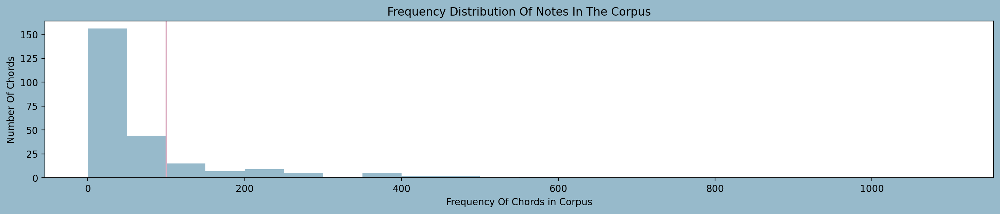

In [239]:
# Plotting the distribution of Notes
plt.figure(figsize=(18,3),facecolor="#97BACB")
bins = np.arange(0,(max(Recurrence)), 50)
plt.hist(Recurrence, bins=bins, color="#97BACB")
plt.axvline(x=100,color="#DBACC1")
plt.title("Frequency Distribution Of Notes In The Corpus")
plt.xlabel("Frequency Of Chords in Corpus")
plt.ylabel("Number Of Chords")
plt.show()

In [240]:
#Getting a list of rare chords
rare_note = []
for index, (key, value) in enumerate(count_num.items()):
    if value < 100:
        m =  key
        rare_note.append(m)

print("Total number of notes that occur less than 100 times:", len(rare_note))

Total number of notes that occur less than 100 times: 200


In [241]:
#Eleminating the rare notes
for element in Corpus:
    if element in rare_note:
        Corpus.remove(element)

print("Length of Corpus after elimination the rare notes:", len(Corpus))

Length of Corpus after elimination the rare notes: 13333


# Preprocessing the Data

In [242]:
# Storing all the unique characters present in my corpus to bult a mapping dic.
symb = sorted(list(set(Corpus)))

L_corpus = len(Corpus) #length of corpus
L_symb = len(symb) #length of total unique characters

#Building dictionary to access the vocabulary from indices and vice versa
mapping = dict((c, i) for i, c in enumerate(symb))
reverse_mapping = dict((i, c) for i, c in enumerate(symb))

print("Total number of characters:", L_corpus)
print("Number of unique characters:", L_symb)

Total number of characters: 13333
Number of unique characters: 188


In [243]:
#Splitting the Corpus in equal length of strings and output target
length = 40
features = []
targets = []
for i in range(0, L_corpus - length, 1):
    feature = Corpus[i:i + length]
    target = Corpus[i + length]
    features.append([mapping[j] for j in feature])
    targets.append(mapping[target])


L_datapoints = len(targets)
print("Total number of sequences in the Corpus:", L_datapoints)

Total number of sequences in the Corpus: 13293


In [244]:
# reshape X and normalize
X = (np.reshape(features, (L_datapoints, length, 1)))/ float(L_symb)
# one hot encode the output variable
y = tf.keras.utils.to_categorical(targets)

In [245]:
#Taking out a subset of data to be used as seed
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model

In [246]:
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

# Initialize the Model
model = Sequential()

# Adding layers with dropout
model.add(tf.keras.layers.Bidirectional(LSTM(128), input_shape=(X.shape[1], X.shape[2])))
model.add(Dropout(0.2))
model.add(Dense(64))
model.add(Dropout(0.2))
model.add(Dense(32))
model.add(Dropout(0.2))
model.add(Dense(16))
model.add(Dropout(0.2))
model.add(Dense(y.shape[1], activation='softmax'))

# Compiling the model for training
opt = Adamax(learning_rate=0.01)
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=["accuracy"])

# Implement Learning Rate Schedule
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, min_lr=0.00001)

# Implement Early Stopping
early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)


In [247]:
#Model's Summary
model.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_10 (Bidirect  (None, 256)               133120    
 ional)                                                          
                                                                 
 dropout_23 (Dropout)        (None, 256)               0         
                                                                 
 dense_21 (Dense)            (None, 64)                16448     
                                                                 
 dropout_24 (Dropout)        (None, 64)                0         
                                                                 
 dense_22 (Dense)            (None, 32)                2080      
                                                                 
 dropout_25 (Dropout)        (None, 32)                0         
                                                     

# Train!

In [248]:

# Training the Model
history = model.fit(X_train, y_train, validation_data=(X_test, y_test), batch_size=256, epochs=500, callbacks=[reduce_lr, early_stop])

Epoch 1/500
42/42 [==============================] - 6s 34ms/step - loss: 4.3871 - accuracy: 0.0648 - val_loss: 4.1664 - val_accuracy: 0.0760 - lr: 0.0100
Epoch 2/500
42/42 [==============================] - 1s 12ms/step - loss: 4.1418 - accuracy: 0.0829 - val_loss: 4.1476 - val_accuracy: 0.0760 - lr: 0.0100
Epoch 3/500
42/42 [==============================] - 1s 12ms/step - loss: 4.1265 - accuracy: 0.0823 - val_loss: 4.1251 - val_accuracy: 0.0884 - lr: 0.0100
Epoch 4/500
42/42 [==============================] - 1s 17ms/step - loss: 4.0677 - accuracy: 0.0954 - val_loss: 4.0956 - val_accuracy: 0.0760 - lr: 0.0100
Epoch 5/500
42/42 [==============================] - 1s 18ms/step - loss: 4.0230 - accuracy: 0.0983 - val_loss: 4.0328 - val_accuracy: 0.0921 - lr: 0.0100
Epoch 6/500
42/42 [==============================] - 1s 19ms/step - loss: 4.0120 - accuracy: 0.0983 - val_loss: 4.0140 - val_accuracy: 0.0925 - lr: 0.0100
Epoch 7/500
42/42 [==============================] - 1s 17ms/step - lo

# Evaluate the Model

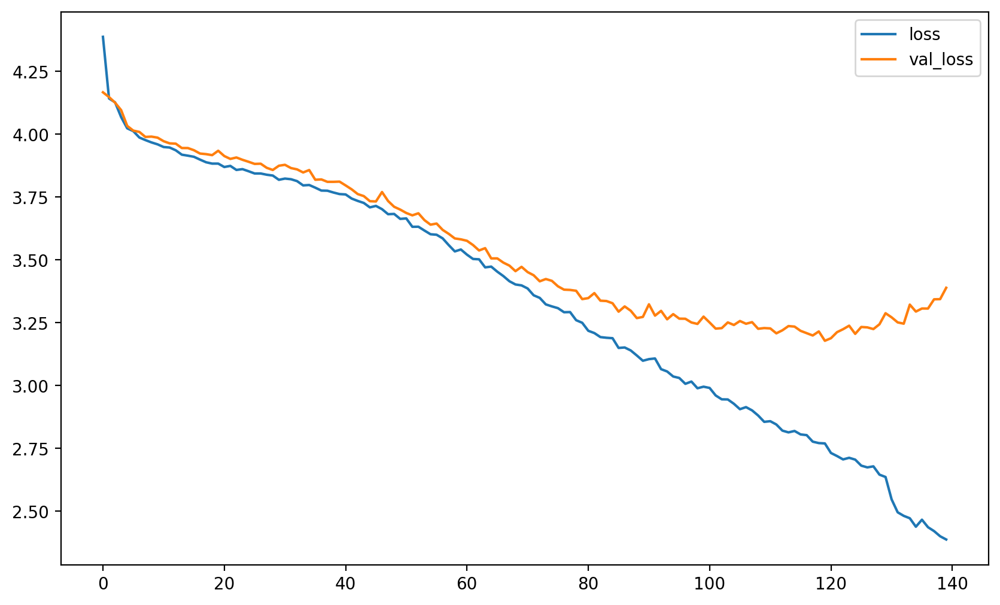

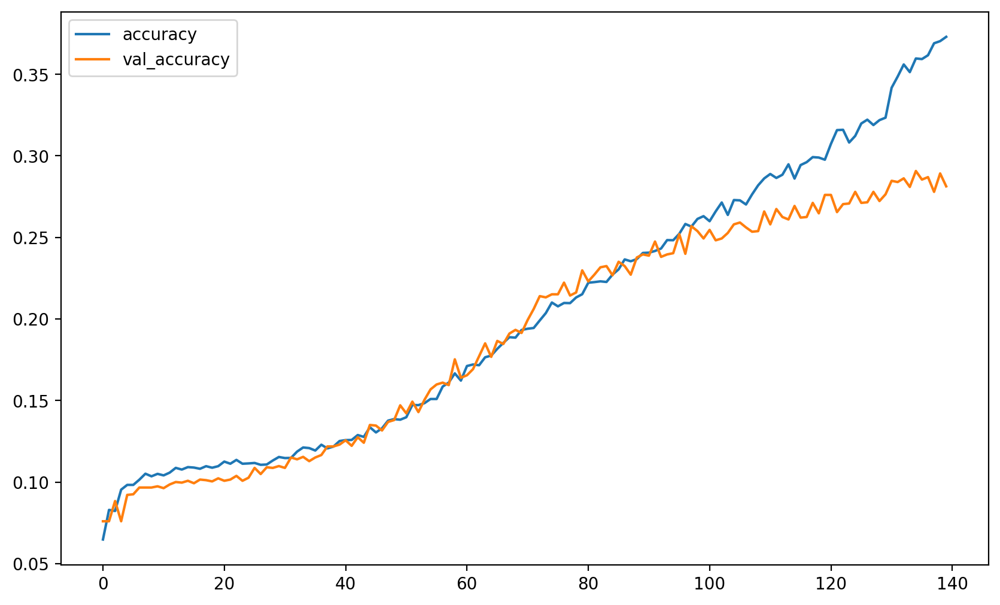

In [249]:
# plot the results

eps = range(len(history.history["loss"]))
plt.figure(figsize=(10, 6))
plt.plot(eps, history.history["loss"])
plt.plot(eps, history.history["val_loss"])
plt.legend(["loss", "val_loss"])

eps = range(len(history.history["accuracy"]))
plt.figure(figsize=(10, 6))
plt.plot(eps, history.history["accuracy"])
plt.plot(eps, history.history["val_accuracy"])
plt.legend(["accuracy", "val_accuracy"])

# Generate Melody

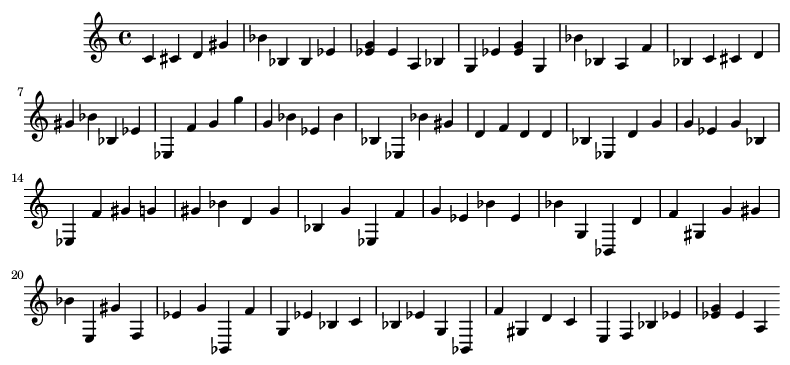

In [250]:
def Melody_Generator(Note_Count):
    seed = X_test[np.random.randint(0,len(X_test)-1)]
    Music = ""
    Notes_Generated=[]
    for i in range(Note_Count):
        seed = seed.reshape(1,length,1)
        prediction = model.predict(seed, verbose=0)[0]
        prediction = np.log(prediction) / 1.0 #diversity
        exp_preds = np.exp(prediction)
        prediction = exp_preds / np.sum(exp_preds)
        index = np.argmax(prediction)
        index_N = index/ float(L_symb)
        Notes_Generated.append(index)
        Music = [reverse_mapping[char] for char in Notes_Generated]
        seed = np.insert(seed[0],len(seed[0]),index_N)
        seed = seed[1:]
    #Now, we have music in form or a list of chords and notes and we want to be a midi file.
    Melody = chords_n_notes(Music)
    Melody_midi = stream.Stream(Melody)
    return Music,Melody_midi


#getting the Notes and Melody created by the model
Music_notes, Melody = Melody_Generator(100)
show(Melody)

# Generate New Music

In [251]:
#To save the generated melody
Melody.write('midi','Melody_Generatedd4.mid')

'Melody_Generatedd4.mid'

## Key Error but Still Works?

* There occurs error at some messages in tracks, i.e. Key Error. I do not know how to solve it or why occurs.

In [252]:
from collections import defaultdict
from mido import MidiFile
from pydub import AudioSegment
from pydub.generators import Sine

def note_to_freq(note, concert_A=440.0):
  return (2.0 ** ((note - 69) / 12.0)) * concert_A

mid = MidiFile("Melody_Generatedd4.mid")
output = AudioSegment.silent(mid.length * 1200.0)

tempo = 150 # bpm

def ticks_to_ms(ticks):
    tick_ms = (60000.0 / tempo) / mid.ticks_per_beat
    return ticks * tick_ms


for track in mid.tracks:
    # position of rendering in ms
    current_pos = 0.0

    current_notes = defaultdict(dict)
    # current_notes = {
    #   channel: {
    #     note: (start_time, message)
    #   }
    # }
    for msg in track:
        current_pos += ticks_to_ms(msg.time)

        if msg.type == 'note_on':
            current_notes[msg.channel][msg.note] = (current_pos, msg)

        if msg.type == 'note_off':
            try:
                start_pos, start_msg = current_notes[msg.channel].pop(msg.note)

                duration = current_pos - start_pos

                signal_generator = Sine(note_to_freq(msg.note))
                rendered = signal_generator.to_audio_segment(duration=duration-50, volume=-20).fade_out(100).fade_in(30)

                output = output.overlay(rendered, start_pos)
            except:
                print(f"Error occured at message: {msg}")

output.export("Melody_Generatedd4.wav", format="wav")

Error occured at message: note_off channel=0 note=63 velocity=0 time=0
Error occured at message: note_off channel=0 note=63 velocity=0 time=0
Error occured at message: note_off channel=0 note=63 velocity=0 time=0


<_io.BufferedRandom name='Melody_Generatedd4.wav'>

In [253]:
#to play audio or corpus
IPython.display.Audio("./Melody_Generatedd4.wav")